<a href="https://colab.research.google.com/github/Salma-Jamal/Leaf-Segmentation-Classification/blob/main/classification_of_plant_disease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Plant Diseases Classification
The project aims to build a model that can be used to classify plant images into their respective class.

* The dataset ([plantvillage-dataset](https://github.com/spMohanty/PlantVillage-Dataset)): has 38 different classes of healthy and diseased plants

* We will use three pre-trained models to evaluate and choose the one that has the best perfomance, the models are:
    * [Resnet34](https://arxiv.org/pdf/1512.03385.pdf)
    * [VGG16](https://arxiv.org/pdf/1409.1556.pdf)    
    * [Densenet169](https://arxiv.org/pdf/1608.06993.pdf)
    
* We will employ two different loss functions to evaluate the one with the best performance in-order to tackle the problem of class-imbalanc. the loss functions are:
    * [Cross Entropy Loss](https://machinelearningmastery.com/cross-entropy-for-machine-learning/)
    * [Focal Loss](https://paperswithcode.com/method/focal-loss)


## Download Dataset

In [ ]:
!git clone https://github.com/spMohanty/PlantVillage-Dataset

Cloning into 'PlantVillage-Dataset'...
remote: Enumerating objects: 163229, done.
remote: Total 163229 (delta 0), reused 0 (delta 0), pack-reused 163229
Receiving objects: 100% (163229/163229), 2.00 GiB | 28.02 MiB/s, done.
Resolving deltas: 100% (99/99), done.
Updating files: 100% (182401/182401), done.


## Imports

In [ ]:
import time
import os
from sklearn.model_selection import train_test_split
import numpy as np
import torch
import torch.optim as optim
from torch import nn
from torch.autograd import Variable
import torchvision
import torchvision.models as models
import torch.utils.model_zoo as model_zoo
import torchvision.transforms as transforms
from torchvision import datasets
import os
import cv2
from itertools import accumulate
from functools import reduce
import time
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import random
from PIL import Image
from tqdm import tqdm_notebook
from torch.optim import Adam
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
import copy
import wandb
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
import copy
import wandb
from typing import Optional
import torch
import torch.nn as nn
import torch.nn.functional as F
from kornia.utils.one_hot import one_hot

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
run = wandb.init(project='Classification_of_Plant_disease')

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
cat: /sys/module/amdgpu/initstate: No such file or directory


## Read Dataset and Prepare Dataloaders

In [ ]:
root_path = '/kaggle/working/PlantVillage-Dataset/raw/color'
classes = os.listdir('/kaggle/working/PlantVillage-Dataset/raw/color')

### Classes Maping Dictionaries
To map between class-name and class-id

In [ ]:
id_name_classes = dict(enumerate(classes))
name_id_classes = {v: k for k, v in id_name_classes.items()}

In [ ]:
print(id_name_classes)

{0: 'Tomato___Target_Spot', 1: 'Grape___Esca_(Black_Measles)', 2: 'Corn_(maize)___Northern_Leaf_Blight', 3: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 4: 'Blueberry___healthy', 5: 'Corn_(maize)___healthy', 6: 'Strawberry___Leaf_scorch', 7: 'Apple___healthy', 8: 'Peach___Bacterial_spot', 9: 'Potato___Late_blight', 10: 'Pepper,_bell___healthy', 11: 'Cherry_(including_sour)___Powdery_mildew', 12: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 13: 'Potato___Early_blight', 14: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 15: 'Apple___Black_rot', 16: 'Grape___Black_rot', 17: 'Squash___Powdery_mildew', 18: 'Grape___healthy', 19: 'Tomato___Bacterial_spot', 20: 'Tomato___Leaf_Mold', 21: 'Tomato___Early_blight', 22: 'Tomato___healthy', 23: 'Tomato___Septoria_leaf_spot', 24: 'Soybean___healthy', 25: 'Corn_(maize)___Common_rust_', 26: 'Apple___Cedar_apple_rust', 27: 'Tomato___Tomato_mosaic_virus', 28: 'Apple___Apple_scab', 29: 'Tomato___Late_blight', 30: 'Potato___healthy', 31: 'Orange___Ha

In [ ]:
print(name_id_classes)

{'Tomato___Target_Spot': 0, 'Grape___Esca_(Black_Measles)': 1, 'Corn_(maize)___Northern_Leaf_Blight': 2, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 3, 'Blueberry___healthy': 4, 'Corn_(maize)___healthy': 5, 'Strawberry___Leaf_scorch': 6, 'Apple___healthy': 7, 'Peach___Bacterial_spot': 8, 'Potato___Late_blight': 9, 'Pepper,_bell___healthy': 10, 'Cherry_(including_sour)___Powdery_mildew': 11, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 12, 'Potato___Early_blight': 13, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 14, 'Apple___Black_rot': 15, 'Grape___Black_rot': 16, 'Squash___Powdery_mildew': 17, 'Grape___healthy': 18, 'Tomato___Bacterial_spot': 19, 'Tomato___Leaf_Mold': 20, 'Tomato___Early_blight': 21, 'Tomato___healthy': 22, 'Tomato___Septoria_leaf_spot': 23, 'Soybean___healthy': 24, 'Corn_(maize)___Common_rust_': 25, 'Apple___Cedar_apple_rust': 26, 'Tomato___Tomato_mosaic_virus': 27, 'Apple___Apple_scab': 28, 'Tomato___Late_blight': 29, 'Potato___healthy': 30, 'Orange___Haungl

### Read the data from directories
Start by reading the dataset from directories to create the dataloaders

In [ ]:
def read_data(root_path,classes_directory,new_shape):
    """
    Read and resize image data from specified directories.

    Parameters:
        root_path (str): The root directory where the image classes are stored.
        classes_directory (list): A list of class directories under the root path.
        new_shape (tuple): The desired shape (height, width) for resizing the images.

    Returns:
        list of numpy.ndarray: A list of resized image data as NumPy arrays.
        list of str: A list of corresponding class labels.
    """
    Images , labels = [], []
    for class_name in classes_directory:
        class_images = os.listdir(os.path.join(root_path,class_name))
        for image in class_images:
            img = cv2.imread(os.path.join(root_path,class_name,image))
            resized_img = cv2.resize(img, new_shape)
            Images.append(resized_img)
            labels.append(class_name)
    return Images , labels

In [ ]:
image_shape = (224,224)
Images , labels = read_data(root_path,classes,image_shape)

### Explore Classes Distribution
##### Check if the distribution of classes is balanced.

In [ ]:
im_copy = Images.copy()
lb_copy = labels.copy()

In [ ]:
def name(class_name):
    """
    Map the class-name to be first and last word only for visualization purposes.
    Parameters:
        class_name (str): The name of class.

    Returns:
        (str): Mapped class name
    """
    first = re.sub(r'[^a-zA-Z]+', ' ', class_name).strip().split(' ')[0]
    last = re.sub(r'[^a-zA-Z]+', ' ', class_name).strip().split(' ')[-1]
    return first+" "+last

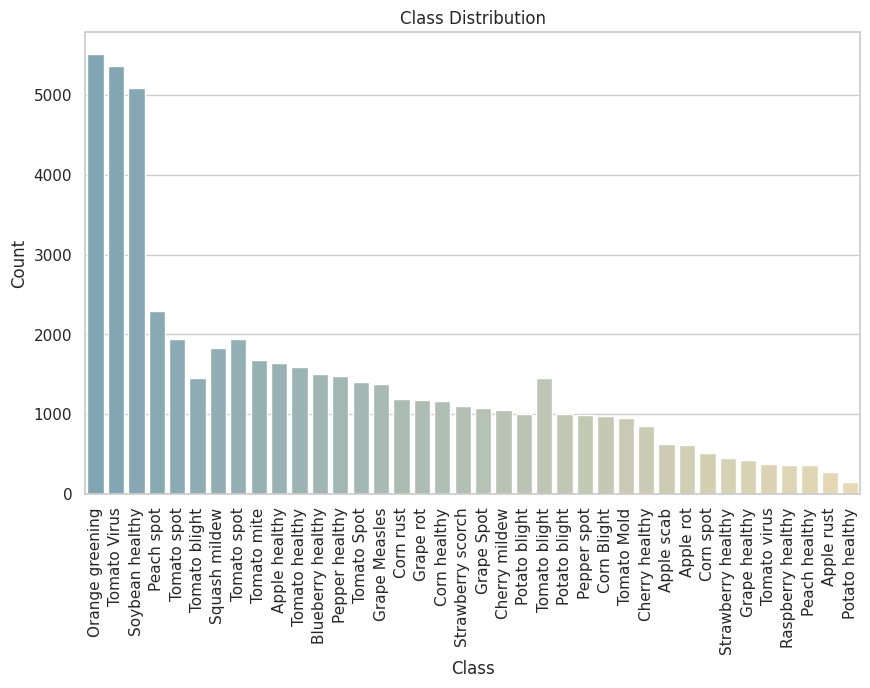

In [ ]:
class_counts = {}
for label in lb_copy:
    if label in class_counts:
        class_counts[label] += 1
    else:
        class_counts[label] = 1

class_counts_df = pd.DataFrame({'Class': list(class_counts.keys()), 'Count': list(class_counts.values())})
class_counts_df['Class'] = class_counts_df['Class'].apply(name)
class_counts_df = class_counts_df.sort_values(by='Count', ascending=False)

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(x='Class', y='Count', data=class_counts_df,errorbar=None,palette='blend:#7AB,#EDA',order=class_counts_df['Class'])
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Class Distribution")
plt.xticks(rotation=90)
plt.show()


1. The classes distributions are not balanced
1. We can try to handle this problem using different loss functions

### Plot Samples of the Dataset

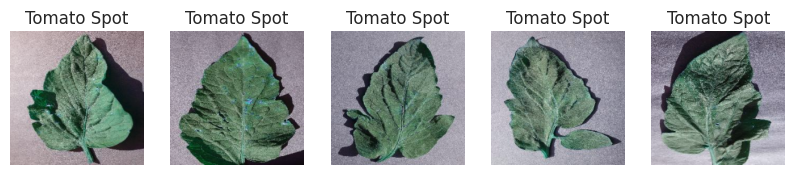

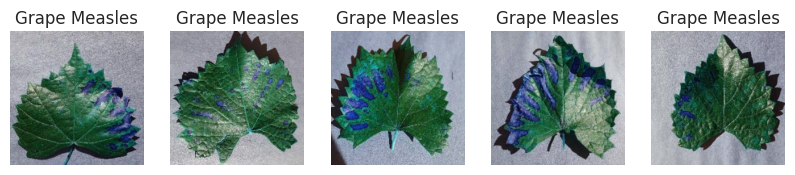

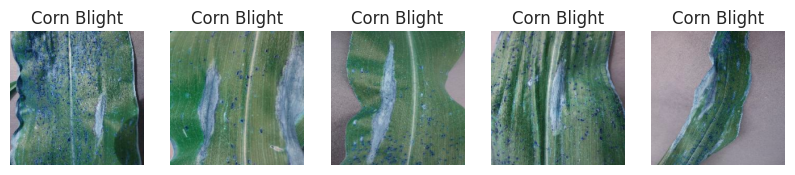

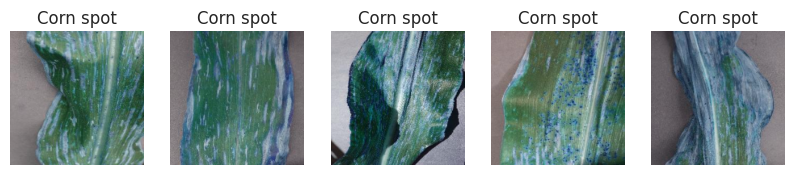

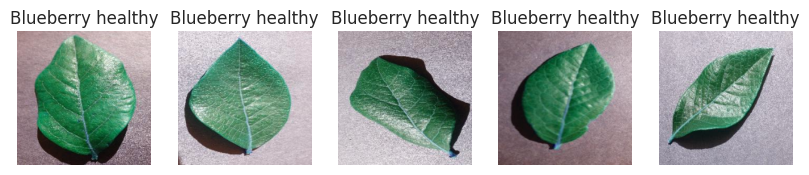

...

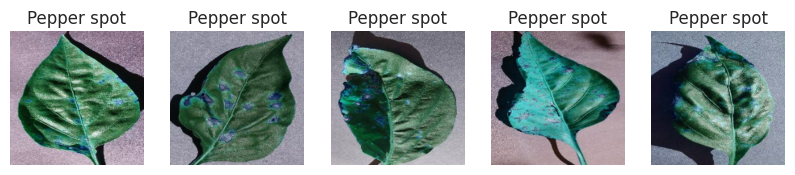

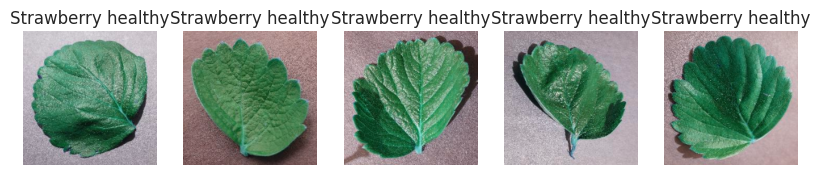

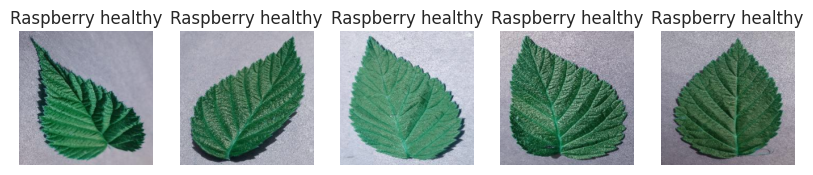

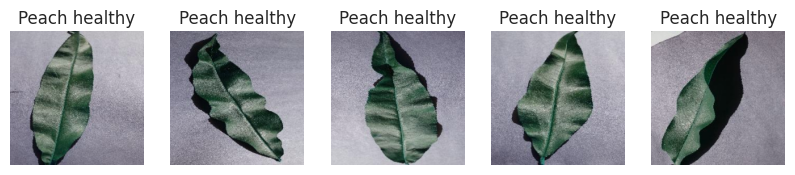

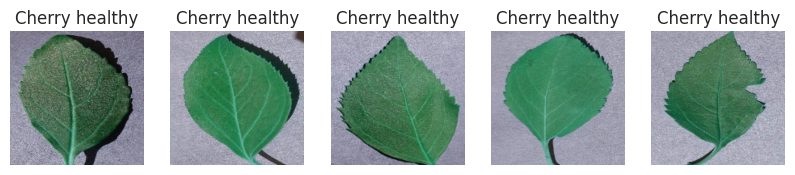

In [ ]:
class_images = {}
for i, label in enumerate(lb_copy):
    if label not in class_images:
        class_images[label] = []
    class_images[label].append(im_copy[i])

num_samples_per_class = 5
for label, images in class_images.items():

    np.random.shuffle(images)

    selected_images = images[:num_samples_per_class]

    # Create a subplot for each sample
    plt.figure(figsize=(10, 2))
    for i, image in enumerate(selected_images):
        plt.subplot(1, num_samples_per_class, i + 1)
        plt.imshow(image)
        plt.title(name(label))
        plt.axis('off')
    plt.show()


### Sample of the data because of computational resources

In [ ]:
random.seed(42)
sample_size = 10000
sample_indices = random.sample(range(len(Images)), sample_size)
sample_images = [Images[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

### Encode labels to numeric format

In [ ]:
sample_labels = [name_id_classes[i] for i in sample_labels]

### Split the dataset into Training, Testing & Validation

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( sample_images , sample_labels ,test_size=0.33, random_state=42)

X_test, X_valid, y_test, y_valid = train_test_split(  X_test , y_test ,test_size=0.5, random_state=42)

In [ ]:
len(X_train), len(X_test), len(X_valid)

(6700, 1650, 1650)

### Data Transformations
Data transformations applied to input images before they are used for training. They enhance the quality of the training data and helps the model generalize better.

In [ ]:
data_transforms = transforms.Compose([
      transforms.RandomHorizontalFlip(),
      transforms.ToTensor(),
      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
      ])

### Custom Dataset Class

In [ ]:
class PlantsDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            image = self.transform(Image.fromarray(image)).numpy()

        return image, label

### Define Dataloaders

In [ ]:
batch_size = 16

In [ ]:
train_dataset = PlantsDataset(np.array(X_train), np.array(y_train),data_transforms)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
valid_dataset = PlantsDataset(np.array(X_valid), np.array(y_valid),data_transforms)
valid_data_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
test_dataset = PlantsDataset(np.array(X_test), np.array(y_test),data_transforms)
test_data_loader = DataLoader(test_dataset, batch_size=batch_size)

## Define the model function

In [ ]:
def initialize_model(model_name,num_classes):
    """
    Initialize a pre-trained deep learning model for transfer learning.

    This function loads a pre-trained model architecture (e.g., ResNet, VGG, DenseNet)
    with pre-trained weights on a large dataset (e.g., ImageNet) and replaces the
    classifier (fully connected) layer with a new one suited for the specified number
    of classes.

    Parameters:
        model_name (str): The name of the pre-trained model architecture to use.
            Supported options: 'resnet', 'vgg', 'densenet'.
        num_classes (int): The number of classes in the new classifier layer.

    Returns:
        torch.nn.Module: A PyTorch model with the specified architecture and a custom
        classifier layer for the given number of classes.
    """
    if model_name == 'resnet':

        network = torchvision.models.resnet34(pretrained=True)
        network.fc = torch.nn.Linear(network.fc.in_features, num_classes)
        torch.nn.init.xavier_uniform_(network.fc.weight)
        return network

    elif model_name == 'vgg':
        network = torchvision.models.vgg16(pretrained=True)
        network.classifier[-1] = torch.nn.Linear(network.classifier[-1].in_features, num_classes)
        torch.nn.init.xavier_uniform_(network.classifier[-1].weight)
        return network
    else:
        network = torchvision.models.densenet169(pretrained=True)
        network.classifier = torch.nn.Linear(network.classifier.in_features, num_classes)
        torch.nn.init.xavier_uniform_(network.classifier.weight)
        return network


### Training Function

In [ ]:
def train(net, train_dataloader, valid_dataloader, criterion, optimizer,name, scheduler=None, epochs=10, device='cpu'):
    """
    Finetuning a pre-trained deep learning model for transfer learning on the dataset
    """
    global_valid_loss = float('inf')
    best_model = net
    start = time.time()
    print(f'Training for {epochs} epochs on {device}')
    for epoch in tqdm_notebook(range(1,epochs+1)):
        print(f"Epoch {epoch}/{epochs}")

        net.train()
        train_loss = torch.tensor(0., device=device)
        train_accuracy = torch.tensor(0., device=device)
        for X, y in train_dataloader:
            X = X.to(device)
            y = y.to(device)
            preds = net(X)
            loss = criterion(preds, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            with torch.no_grad():
                train_loss += loss * train_dataloader.batch_size
                train_accuracy += (torch.argmax(preds, dim=1) == y).sum()

        if valid_dataloader is not None:
            net.eval()
            valid_loss = torch.tensor(0., device=device)
            valid_accuracy = torch.tensor(0., device=device)
            all_preds = []
            all_labels = []
            with torch.no_grad():
                for X, y in valid_dataloader:
                    X = X.to(device)
                    y = y.to(device)
                    preds = net(X)
                    loss = criterion(preds, y)

                    valid_loss += loss * valid_dataloader.batch_size
                    valid_accuracy += (torch.argmax(preds, dim=1) == y).sum()

                    all_preds.extend(torch.argmax(preds, dim=1).cpu().numpy())
                    all_labels.extend(y.cpu().numpy())


            macro_f1 = f1_score(all_labels, all_preds, average='macro')

        if scheduler is not None:
            scheduler.step()

        print(f'Training loss: {train_loss/len(train_dataloader.dataset):.2f}')
        print(f'Training accuracy: {100*train_accuracy/len(train_dataloader.dataset):.2f}')
        print()
        if valid_dataloader is not None:
            v_loss = valid_loss/len(valid_dataloader.dataset)
            print(f'Valid loss: {valid_loss/len(valid_dataloader.dataset):.2f}')
            print(f'Valid accuracy: {100*valid_accuracy/len(valid_dataloader.dataset):.2f}')
            print(f'Macro F1 score: {macro_f1:.2f}')

            if global_valid_loss > v_loss:
                global_valid_loss = v_loss
                best_model =copy.deepcopy(net)
                torch.save({
                'epoch': epoch,
                'state_dict': net.state_dict(),
                'optimizer': optimizer.state_dict(),
            }, name+'_checkpoint.pth.tar')

        print()

    end = time.time()
    print(f'Total training time: {end-start:.1f} seconds')
    return best_model


### Testing Function

In [ ]:
def testing(model,test_dataloader):
    """
    Testing the trained deep learning model for transfer learning on the testing dataset
    """
    preds = []

    model.eval()
    with torch.no_grad():
        for X, _ in test_dataloader:
            X = X.to(device)
            preds.extend(model(X).argmax(dim=1).type(torch.int32).cpu().numpy())
    return preds

### Model Parameters

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 1e-5
weight_decay =  5e-4
epochs =   5
num_classes = 38

### Initialize model
We will use three pre-trained CNN models to evaluate their perfomance on the dataset:
* Resnet34
* VGG16
* Densenet169

In [ ]:
resnet34 = initialize_model('resnet',num_classes)
vgg16 = initialize_model('vgg',num_classes)
densenet169 = initialize_model('densenet',num_classes)

### Define the learning rates for different parameter groups

In [ ]:
def learning_rates(model,model_name,lr):

    learning_rates = {'body': lr, 'fc': lr * 10}

    if model_name == 'resnet':
        body = [param for name, param in model.named_parameters() if 'fc' not in str(name)]
        param_groups = [
            {'params':  body, 'lr': learning_rates['body']},
            {'params': model.fc.parameters(), 'lr': learning_rates['fc']}
        ]
    else:
        body = [param for name, param in model.named_parameters() if 'classifier' not in str(name)]
        param_groups = [
            {'params':  body, 'lr': learning_rates['body']},
            {'params': model.classifier.parameters(), 'lr': learning_rates['fc']}
        ]

    optimizer = Adam(param_groups, weight_decay=weight_decay)

    return optimizer

In [ ]:
optimizer_resnet = learning_rates(resnet34,'resnet',lr)
optimizer_densenet = learning_rates(densenet169,'densenet',lr)
optimizer_vgg = learning_rates(vgg16,'vgg',lr)

In [ ]:
criterion = torch.nn.CrossEntropyLoss()

## Resnet34
Finetune and test Resnet34 on the dataset.

### Training

In [ ]:
resnet34 = train(resnet34.to(device), train_data_loader, valid_data_loader, criterion, optimizer_resnet,'Resnet34', None, epochs, device)

Training for 5 epochs on cuda


/tmp/ipykernel_29/4154979642.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(1,epochs+1)):


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5
Training loss: 1.47
Training accuracy: 64.90

Valid loss: 0.49
Valid accuracy: 89.27
Macro F1 score: 0.82

Epoch 2/5
Training loss: 0.36
Training accuracy: 91.46

Valid loss: 0.25
Valid accuracy: 93.82
Macro F1 score: 0.90

Epoch 3/5
Training loss: 0.20
Training accuracy: 95.24

Valid loss: 0.16
Valid accuracy: 95.82
Macro F1 score: 0.94

Epoch 4/5
Training loss: 0.11
Training accuracy: 97.75

Valid loss: 0.14
Valid accuracy: 96.12
Macro F1 score: 0.94

Epoch 5/5
Training loss: 0.08
Training accuracy: 98.55

Valid loss: 0.12
Valid accuracy: 96.73
Macro F1 score: 0.95

Total training time: 133.2 seconds


#### Testing

In [ ]:
preds = testing(resnet34,test_data_loader)
True_labels = test_dataset.labels
pred_labels = preds


accuracy = accuracy_score(True_labels, pred_labels)
f1 = f1_score(True_labels, pred_labels, average='macro')

print(f'Testing Accuracy: {accuracy:.2f}')
print(f'Testing F1 Score: {f1:.2f}')


Testing Accuracy: 0.96
Testing F1 Score: 0.96


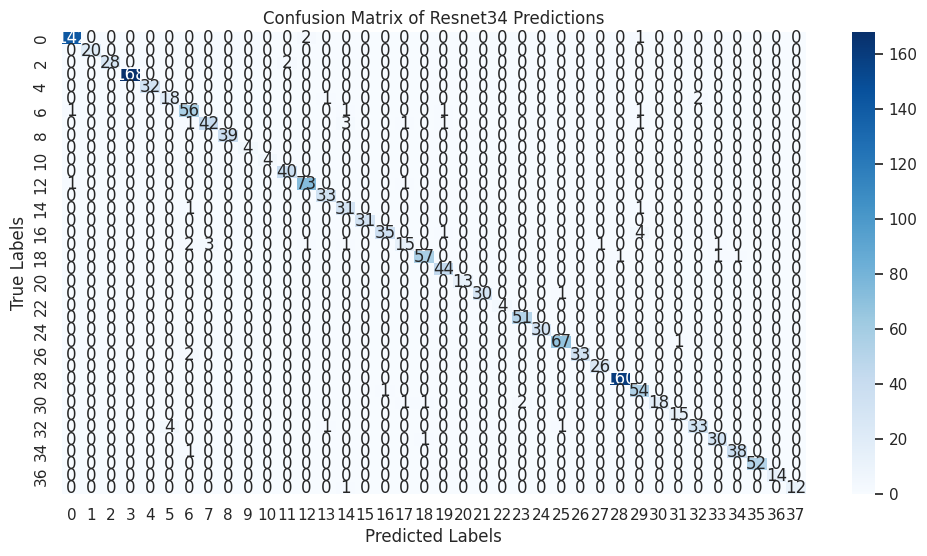

In [ ]:
conf_matrix = confusion_matrix(True_labels, pred_labels)

plt.figure(figsize=(12, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix of Resnet34 Predictions')
plt.show()


In [ ]:
artifact = wandb.Artifact('resnet34_model', type='model')
artifact.add_file('/kaggle/working/Resnet34_checkpoint.pth.tar')
run.log_artifact(artifact)

<Artifact resnet34_model>

## Densenet169
Fine-tune and test Densenet169 on the dataset.

### Training

In [ ]:
densenet169 = train(densenet169.to(device), train_data_loader, valid_data_loader, criterion, optimizer_densenet,'densenet169', None, epochs, device)

Training for 5 epochs on cuda


/tmp/ipykernel_29/4154979642.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(1,epochs+1)):


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5
Training loss: 1.66
Training accuracy: 61.87

Valid loss: 0.61
Valid accuracy: 87.52
Macro F1 score: 0.77

Epoch 2/5
Training loss: 0.45
Training accuracy: 91.58

Valid loss: 0.25
Valid accuracy: 94.00
Macro F1 score: 0.90

Epoch 3/5
Training loss: 0.21
Training accuracy: 96.31

Valid loss: 0.16
Valid accuracy: 95.88
Macro F1 score: 0.95

Epoch 4/5
Training loss: 0.13
Training accuracy: 97.76

Valid loss: 0.12
Valid accuracy: 97.21
Macro F1 score: 0.97

Epoch 5/5
Training loss: 0.09
Training accuracy: 98.51

Valid loss: 0.10
Valid accuracy: 97.27
Macro F1 score: 0.97

Total training time: 303.2 seconds


### Testing

In [ ]:
preds = testing(densenet169,test_data_loader)
True_labels = test_dataset.labels
pred_labels = preds


accuracy = accuracy_score(True_labels, pred_labels)
f1 = f1_score(True_labels, pred_labels, average='macro')

print(f'Testing Accuracy: {accuracy:.2f}')
print(f'Testing F1 Score: {f1:.2f}')

Testing Accuracy: 0.97
Testing F1 Score: 0.96


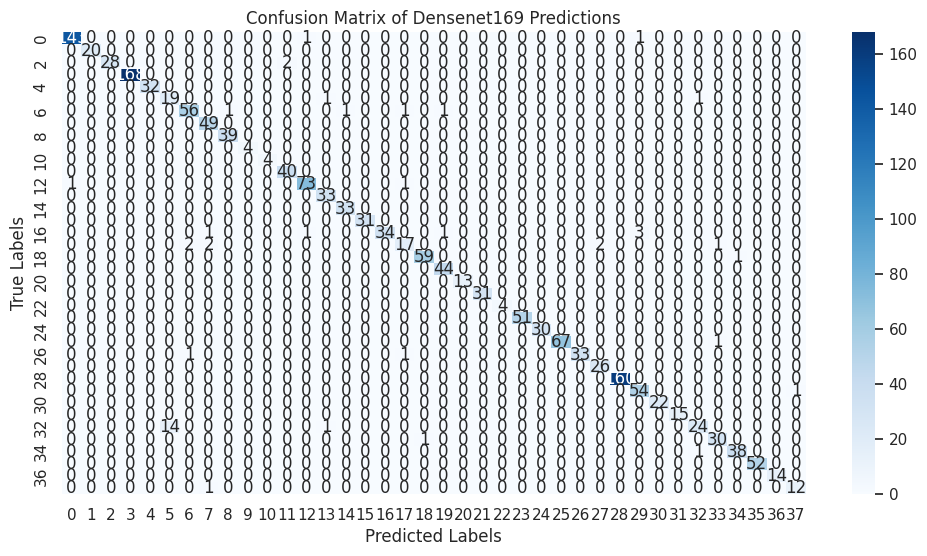

In [ ]:
conf_matrix = confusion_matrix(True_labels, pred_labels)

plt.figure(figsize=(12, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix of Densenet169 Predictions')
plt.show()


In [ ]:
artifact = wandb.Artifact('densenet169_model', type='model')
artifact.add_file('/kaggle/working/densenet169_checkpoint.pth.tar')
run.log_artifact(artifact)

<Artifact densenet169_model>

## VGG16
Fine-tune and test VGG16 on the dataset.

## Training

In [ ]:
vgg16 = train(vgg16.to(device), train_data_loader, valid_data_loader, criterion, optimizer_vgg,'VGG16', None, epochs, device)

Training for 5 epochs on cuda


/tmp/ipykernel_29/4154979642.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(1,epochs+1)):


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5
Training loss: 0.86
Training accuracy: 75.75

Valid loss: 0.29
Valid accuracy: 91.45
Macro F1 score: 0.88

Epoch 2/5
Training loss: 0.18
Training accuracy: 94.27

Valid loss: 0.16
Valid accuracy: 95.15
Macro F1 score: 0.93

Epoch 3/5
Training loss: 0.12
Training accuracy: 96.67

Valid loss: 0.17
Valid accuracy: 94.85
Macro F1 score: 0.93

Epoch 4/5
Training loss: 0.06
Training accuracy: 98.04

Valid loss: 0.17
Valid accuracy: 94.85
Macro F1 score: 0.93

Epoch 5/5
Training loss: 0.05
Training accuracy: 98.27

Valid loss: 0.18
Valid accuracy: 95.82
Macro F1 score: 0.94

Total training time: 345.5 seconds


### Testing

In [ ]:
preds = testing(vgg16,test_data_loader)
True_labels = test_dataset.labels
pred_labels = preds


accuracy = accuracy_score(True_labels, pred_labels)
f1 = f1_score(True_labels, pred_labels, average='macro')

print(f'Testing Accuracy: {accuracy:.2f}')
print(f'Testing F1 Score: {f1:.2f}')

Testing Accuracy: 0.94
Testing F1 Score: 0.92


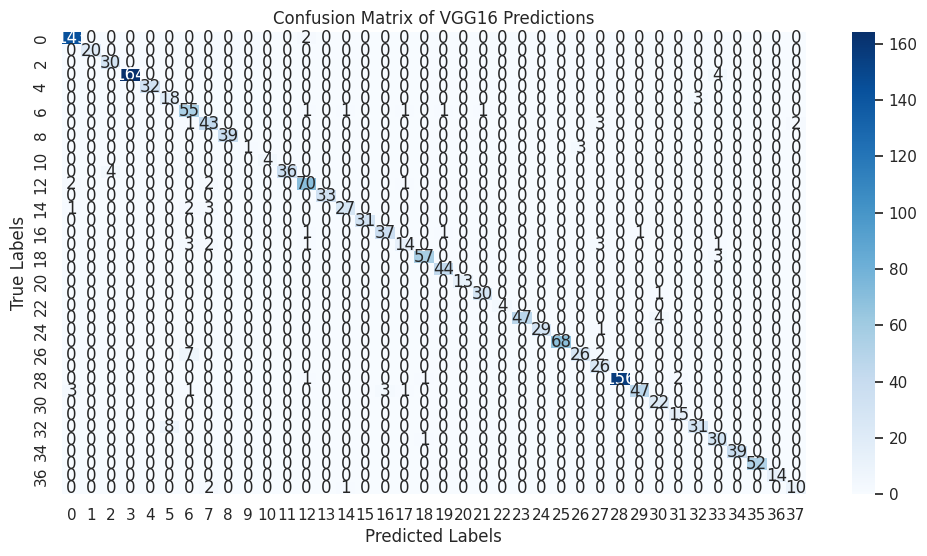

In [ ]:
conf_matrix = confusion_matrix(True_labels, pred_labels)

plt.figure(figsize=(12, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix of VGG16 Predictions')
plt.show()


In [ ]:
artifact = wandb.Artifact('vgg16_model', type='model')
artifact.add_file('/kaggle/working/VGG16_checkpoint.pth.tar')
run.log_artifact(artifact)

<Artifact vgg16_model>

## Finetune the  pretrained models with Focal Loss
To try and tackle the problem of class-imbalance that is present in the dataset we will use the Focal Loss.

In [ ]:
def linear_combination(x, y):
  smoothing = 0.1
  return smoothing * x + (1 - smoothing) * y


def reduce_loss(loss):
  reduction = 'mean'
  return loss.mean() if reduction == 'mean' else loss.sum() \
    if reduction == 'sum' else loss


def focal_loss(
        input: torch.Tensor,
        target: torch.Tensor,
        alpha: float,
        gamma: float = 2.0,
        reduction: str = 'none',
        eps: float = 1e-8) -> torch.Tensor:

    if not isinstance(input, torch.Tensor):
        raise TypeError("Input type is not a torch.Tensor. Got {}"
                        .format(type(input)))

    if not len(input.shape) >= 2:
        raise ValueError("Invalid input shape, we expect BxCx*. Got: {}"
                         .format(input.shape))

    if input.size(0) != target.size(0):
        raise ValueError('Expected input batch_size ({}) to match target batch_size ({}).'
                         .format(input.size(0), target.size(0)))

    n = input.size(0)
    num_classes=input.shape[1]
    out_size = (n,) + input.size()[2:]
    if target.size()[1:] != input.size()[2:]:
        raise ValueError('Expected target size {}, got {}'.format(
            out_size, target.size()))

    if not input.device == target.device:
        raise ValueError(
            "input and target must be in the same device. Got: {} and {}" .format(
                input.device, target.device))

    # compute softmax over the classes axis
    input_soft: torch.Tensor = F.softmax(input, dim=1) + eps

    loss_soft = reduce_loss(-input_soft.sum(dim=-1))
    # create the labels one hot tensor
    target_one_hot: torch.Tensor = one_hot(
        target, num_classes=input.shape[1],
        device=input.device, dtype=input.dtype)

    # compute the actual focal loss
    weight = torch.pow(-input_soft + 1., gamma)

    focal = -alpha * weight * torch.log(input_soft)
    loss_tmp = torch.sum(target_one_hot * focal, dim=1)
    if reduction == 'none':
        loss = loss_tmp
    elif reduction == 'mean':
        loss = torch.mean(loss_tmp)
    elif reduction == 'sum':
        loss = torch.sum(loss_tmp)
    else:
        raise NotImplementedError("Invalid reduction mode: {}"
                                  .format(reduction))
    return linear_combination(loss_soft / num_classes, loss)


class FocalLoss(nn.Module):

    def __init__(self, alpha: float, gamma: float = 2.0,
                 reduction: str = 'none', eps: float = 1e-8) -> None:
        super(FocalLoss, self).__init__()
        self.alpha: float = alpha
        self.gamma: float = gamma
        self.reduction: str = reduction
        self.eps: float = eps

    def forward(self, input: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
        return focal_loss(input, target, self.alpha, self.gamma, self.reduction, self.eps)


In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 1e-5
weight_decay =  5e-4
epochs =   5
num_classes = 38

In [ ]:
resnet34 = initialize_model('resnet',num_classes)
vgg16 = initialize_model('vgg',num_classes)
densenet169 = initialize_model('densenet',num_classes)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet169_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet169_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
criterion = FocalLoss(alpha=0.5, gamma=2.0, reduction='mean')

In [ ]:
optimizer_resnet = learning_rates(resnet34,'resnet',lr)
optimizer_densenet = learning_rates(densenet169,'densenet',lr)
optimizer_vgg = learning_rates(vgg16,'vgg',lr)

### Resnet

In [ ]:
resnet34 = train(resnet34.to(device), train_data_loader, valid_data_loader, criterion, optimizer_resnet,'Resnet34', None, epochs, device)

Training for 5 epochs on cuda


/tmp/ipykernel_163/4154979642.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(1,epochs+1)):


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5
Training loss: 0.51
Training accuracy: 65.07

Valid loss: 0.12
Valid accuracy: 89.58
Macro F1 score: 0.82

Epoch 2/5
Training loss: 0.08
Training accuracy: 91.03

Valid loss: 0.05
Valid accuracy: 93.76
Macro F1 score: 0.90

Epoch 3/5
Training loss: 0.04
Training accuracy: 95.60

Valid loss: 0.04
Valid accuracy: 95.21
Macro F1 score: 0.93

Epoch 4/5
Training loss: 0.02
Training accuracy: 97.36

Valid loss: 0.04
Valid accuracy: 94.85
Macro F1 score: 0.93

Epoch 5/5
Training loss: 0.01
Training accuracy: 98.27

Valid loss: 0.03
Valid accuracy: 96.00
Macro F1 score: 0.94

Total training time: 134.0 seconds


In [ ]:
preds = testing(resnet34,test_data_loader)
True_labels = test_dataset.labels
pred_labels = preds


accuracy = accuracy_score(True_labels, pred_labels)
f1 = f1_score(True_labels, pred_labels, average='macro')

print(f'Testing Accuracy: {accuracy:.2f}')
print(f'Testing F1 Score: {f1:.2f}')


Testing Accuracy: 0.96
Testing F1 Score: 0.94


### Densenet

In [ ]:
densenet169 = train(densenet169.to(device), train_data_loader, valid_data_loader, criterion, optimizer_densenet,'densenet169', None, epochs, device)

Training for 5 epochs on cuda


/tmp/ipykernel_206/4154979642.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(1,epochs+1)):


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5
Training loss: 0.61
Training accuracy: 61.43

Valid loss: 0.16
Valid accuracy: 87.58
Macro F1 score: 0.75

Epoch 2/5
Training loss: 0.11
Training accuracy: 91.81

Valid loss: 0.05
Valid accuracy: 94.73
Macro F1 score: 0.91

Epoch 3/5
Training loss: 0.04
Training accuracy: 96.10

Valid loss: 0.03
Valid accuracy: 96.42
Macro F1 score: 0.94

Epoch 4/5
Training loss: 0.02
Training accuracy: 97.96

Valid loss: 0.02
Valid accuracy: 97.33
Macro F1 score: 0.96

Epoch 5/5
Training loss: 0.01
Training accuracy: 98.69

Valid loss: 0.02
Valid accuracy: 97.39
Macro F1 score: 0.96

Total training time: 304.9 seconds


In [ ]:
preds = testing(densenet169,test_data_loader)
True_labels = test_dataset.labels
pred_labels = preds


accuracy = accuracy_score(True_labels, pred_labels)
f1 = f1_score(True_labels, pred_labels, average='macro')

print(f'Testing Accuracy: {accuracy:.2f}')
print(f'Testing F1 Score: {f1:.2f}')


Testing Accuracy: 0.97
Testing F1 Score: 0.94


### VGG

In [ ]:
vgg16 = train(vgg16.to(device), train_data_loader, valid_data_loader, criterion, optimizer_vgg,'VGG16', None, epochs, device)

Training for 5 epochs on cuda


/tmp/ipykernel_206/4154979642.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(1,epochs+1)):


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5
Training loss: 0.30
Training accuracy: 75.16

Valid loss: 0.08
Valid accuracy: 90.30
Macro F1 score: 0.85

Epoch 2/5
Training loss: 0.06
Training accuracy: 92.63

Valid loss: 0.06
Valid accuracy: 92.91
Macro F1 score: 0.91

Epoch 3/5
Training loss: 0.03
Training accuracy: 95.58

Valid loss: 0.04
Valid accuracy: 94.91
Macro F1 score: 0.93

Epoch 4/5
Training loss: 0.02
Training accuracy: 97.28

Valid loss: 0.04
Valid accuracy: 94.55
Macro F1 score: 0.92

Epoch 5/5
Training loss: 0.02
Training accuracy: 97.49

Valid loss: 0.05
Valid accuracy: 94.06
Macro F1 score: 0.92

Total training time: 363.1 seconds


In [ ]:
preds = testing(vgg16,test_data_loader)
True_labels = test_dataset.labels
pred_labels = preds


accuracy = accuracy_score(True_labels, pred_labels)
f1 = f1_score(True_labels, pred_labels, average='macro')

print(f'Testing Accuracy: {accuracy:.2f}')
print(f'Testing F1 Score: {f1:.2f}')


Testing Accuracy: 0.95
Testing F1 Score: 0.93


* Using the Focal Loss enhanced the perfomance with VGG16 with 1% increase in accuracy and macro-F1 score.
* We can try using different Loss function to test their perfomance or increase the training data and complexity of the models.
* The model that achieves the best perfomance is Densenet169 with cross entropy loss achieving 97%, 96% Accuracy and Macro-F1 score respectively.

## Inference

### Download and load checkpoints
* [Resnet34 Model Checkpoint](https://wandb.ai/pedestrian-segmentation/Classification_of_Plant_disease/artifacts/model/resnet34_model/v0)

* [VGG16 Model Checkpoint](https://wandb.ai/pedestrian-segmentation/Classification_of_Plant_disease/artifacts/model/vgg16_model/v0)

* [Densenet169 Model Checkpoint](https://wandb.ai/pedestrian-segmentation/Classification_of_Plant_disease/artifacts/model/densenet169_model/v0)

In [ ]:
artifact = run.use_artifact('pedestrian-segmentation/Classification_of_Plant_disease/vgg16_model:v0', type='model')
artifact_dir = artifact.download()

wandb: Downloading large artifact vgg16_model:v0, 1538.31MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:2:5.2


In [ ]:
artifact = run.use_artifact('pedestrian-segmentation/Classification_of_Plant_disease/resnet34_model:v0', type='model')
artifact_dir = artifact.download()

wandb: Downloading large artifact resnet34_model:v0, 244.04MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:23.5


In [ ]:
artifact = run.use_artifact('pedestrian-segmentation/Classification_of_Plant_disease/densenet169_model:v0', type='model')
artifact_dir = artifact.download()

wandb: Downloading large artifact densenet169_model:v0, 145.02MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:12.3


In [ ]:
Inf_vgg16 = initialize_model('vgg',38)
checkpoint = torch.load('/kaggle/working/artifacts/vgg16_model:v0/VGG16_checkpoint.pth.tar')
Inf_vgg16.load_state_dict(checkpoint['state_dict'])

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [ ]:
Inf_resnet34 = initialize_model('resnet',38)
checkpoint = torch.load('/kaggle/working/artifacts/resnet34_model:v0/Resnet34_checkpoint.pth.tar')
Inf_resnet34.load_state_dict(checkpoint['state_dict'])

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [ ]:
Inf_densenet = initialize_model('densenet',38)
checkpoint = torch.load('/kaggle/working/artifacts/densenet169_model:v0/densenet169_checkpoint.pth.tar')
Inf_densenet.load_state_dict(checkpoint['state_dict'])

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet169_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet169_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [ ]:
def predict(Test_Image, model):
    """
    Predicts the class label for a given input image using a trained model.

    Parameters:
        Test_Image (PIL.Image or torch.Tensor): The input image to be classified.
        model (torch.nn.Module): The trained deep learning model for image classification.

    Returns:
        int: The predicted class label for the input image.
    """
    # Define a series of data transformations for the input image
    data_transforms = transforms.Compose([
        transforms.ToTensor(),  # Convert the image to a PyTorch tensor
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize the image
    ])

    # Set the model to evaluation mode (no gradient calculation)
    model.eval()

    # Apply the defined transformations to the input image
    Test_Image = data_transforms(Test_Image)

    # Add a batch dimension to the image tensor
    Test_Image = Test_Image.unsqueeze(0)

    # Perform forward pass through the model and get predictions
    with torch.no_grad():
        predictions = model(Test_Image)

    # Apply softmax to obtain class probabilities and get the class with highest probability
    softmax = torch.nn.Softmax(dim=1)
    pred = torch.argmax(softmax(predictions), dim=1)

    # Return the predicted class label as an integer
    return pred.item()


In [ ]:
id_name_classes= {0: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 1: 'Grape___healthy', 2: 'Grape___Black_rot', 3: 'Orange___Haunglongbing_(Citrus_greening)', 4: 'Blueberry___healthy', 5: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 6: 'Tomato___Late_blight', 7: 'Tomato___Septoria_leaf_spot', 8: 'Corn_(maize)___Common_rust_', 9: 'Potato___healthy', 10: 'Apple___Cedar_apple_rust', 11: 'Grape___Esca_(Black_Measles)', 12: 'Tomato___Bacterial_spot', 13: 'Corn_(maize)___healthy', 14: 'Tomato___Leaf_Mold', 15: 'Cherry_(including_sour)___healthy', 16: 'Tomato___Target_Spot', 17: 'Tomato___Early_blight', 18: 'Pepper,_bell___healthy', 19: 'Tomato___healthy', 20: 'Strawberry___healthy', 21: 'Cherry_(including_sour)___Powdery_mildew', 22: 'Raspberry___healthy', 23: 'Apple___healthy', 24: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 25: 'Peach___Bacterial_spot', 26: 'Potato___Late_blight', 27: 'Potato___Early_blight', 28: 'Soybean___healthy', 29: 'Tomato___Spider_mites Two-spotted_spider_mite', 30: 'Apple___Apple_scab', 31: 'Peach___healthy', 32: 'Corn_(maize)___Northern_Leaf_Blight', 33: 'Pepper,_bell___Bacterial_spot', 34: 'Strawberry___Leaf_scorch', 35: 'Squash___Powdery_mildew', 36: 'Apple___Black_rot', 37: 'Tomato___Tomato_mosaic_virus'}
name_id_classes = {'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 0, 'Grape___healthy': 1, 'Grape___Black_rot': 2, 'Orange___Haunglongbing_(Citrus_greening)': 3, 'Blueberry___healthy': 4, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 5, 'Tomato___Late_blight': 6, 'Tomato___Septoria_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Potato___healthy': 9, 'Apple___Cedar_apple_rust': 10, 'Grape___Esca_(Black_Measles)': 11, 'Tomato___Bacterial_spot': 12, 'Corn_(maize)___healthy': 13, 'Tomato___Leaf_Mold': 14, 'Cherry_(including_sour)___healthy': 15, 'Tomato___Target_Spot': 16, 'Tomato___Early_blight': 17, 'Pepper,_bell___healthy': 18, 'Tomato___healthy': 19, 'Strawberry___healthy': 20, 'Cherry_(including_sour)___Powdery_mildew': 21, 'Raspberry___healthy': 22, 'Apple___healthy': 23, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 24, 'Peach___Bacterial_spot': 25, 'Potato___Late_blight': 26, 'Potato___Early_blight': 27, 'Soybean___healthy': 28, 'Tomato___Spider_mites Two-spotted_spider_mite': 29, 'Apple___Apple_scab': 30, 'Peach___healthy': 31, 'Corn_(maize)___Northern_Leaf_Blight': 32, 'Pepper,_bell___Bacterial_spot': 33, 'Strawberry___Leaf_scorch': 34, 'Squash___Powdery_mildew': 35, 'Apple___Black_rot': 36, 'Tomato___Tomato_mosaic_virus': 37}

### Generate Random Image ID to test the models

### Example 1

In [ ]:
ID = int(random.uniform(0, len(Images)))
ID

16777

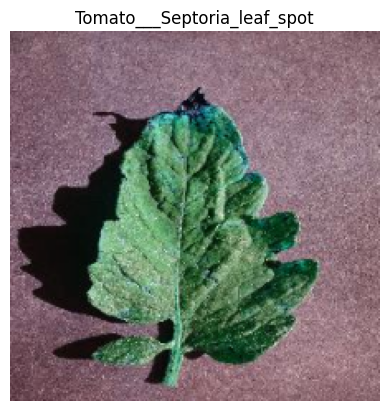

In [ ]:
plt.imshow(Images[ID])
plt.axis('off')
plt.title(labels[ID])
plt.show()

In [ ]:
pred = predict(Images[ID],Inf_vgg16)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Tomato___Septoria_leaf_spot


In [ ]:
pred = predict(Images[ID],Inf_densenet)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Tomato___Septoria_leaf_spot


In [ ]:
pred = predict(Images[ID],Inf_resnet34)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Tomato___Septoria_leaf_spot


### Example 2

In [ ]:
ID = int(random.uniform(0, len(Images)))
ID

24565

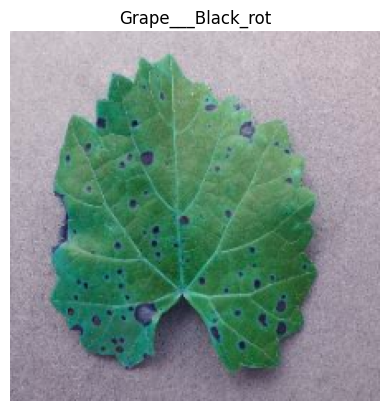

In [ ]:
plt.imshow(Images[ID])
plt.axis('off')
plt.title(labels[ID])
plt.show()

In [ ]:
pred = predict(Images[ID],Inf_densenet)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Grape___Black_rot


In [ ]:
pred = predict(Images[ID],Inf_vgg16)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Grape___Black_rot


In [ ]:
pred = predict(Images[ID],Inf_resnet34)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Grape___Black_rot


### Example 3

In [ ]:
ID = int(random.uniform(0, len(Images)))
ID

10420

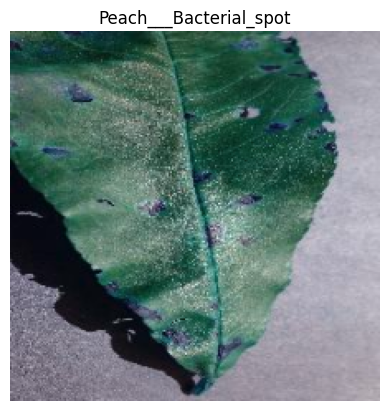

In [ ]:
plt.imshow(Images[ID])
plt.axis('off')
plt.title(labels[ID])
plt.show()

In [ ]:
pred = predict(Images[ID],Inf_vgg16)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Peach___Bacterial_spot


In [ ]:
pred = predict(Images[ID],Inf_densenet)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Peach___Bacterial_spot


In [ ]:
pred = predict(Images[ID],Inf_resnet34)
print(f"Predicted Class: {id_name_classes[pred]}")

Predicted Class: Peach___Bacterial_spot
